<a href="https://colab.research.google.com/github/rAvinashoy/Classification_Mobile_Price_Range_Prediction/blob/main/Mobile_Price_Range_Prediction_Classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Project Name**    - **MOBILE PRICE RANGE PREDICTION**



##### **Project Type**    - Classification
##### **Contribution**    - Team
##### **Team Member 1**   - **Avinash Kumar**
##### **Team Member 2**   - **Siddhi Thorat**

# **Project Summary -**

**Data Preprocessing** :

1. Getting the dataset
2. Importing libraries
3. Importing datasets
4. Finding Missing Data
5. Encoding Categorical Data
6. Data Cleaning and Feature Engineering

**Exploratory data analysis(EDA) :**

1.Firstly Checked correlation between Each Features in dataset.

2.Checked if bluetooth and wifi available or not???

3.Checked can Battery Power be affected in mobile Price?? and how the battery mAh is spread

4.Checked can Ram, Screen Height  ,Screen width,pixel Height ,pixel width be affected in mobile Price??

5.Checked can 4G and 3G be affected in mobile Price??

6.Checked can FC (front camera megapixels) ,PC (Primary camera Megapixels) and Mobile Weight affected in mobile Price??

**Supervise Machine learning algorithms and implementation :**

1. Logistic regression

2. Random Forest Classifier

3. XG Boost Classifier







# **GitHub Link -**

# **Problem Statement**


**In the competitive mobile phone market companies want to understand sales data of mobile phones and factors which drive the prices. The objective is to find out some relation between features of a mobile phone(eg:- RAM, Internal Memory, etc) and its selling price. In this problem, we do not have to predict the actual price but a price range indicating how high the price is.**

# ***Let's Begin !***

## ***1. Know Your Data***

### Import Libraries

In [ ]:
# Import Libraries
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
%matplotlib inline
import seaborn as sns

from datetime import datetime

from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, precision_score, recall_score, roc_auc_score
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV

import warnings
warnings.filterwarnings("ignore")

### Dataset Loading

In [ ]:
# Mount Drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Load Dataset
df = pd.read_csv('/content/drive/MyDrive/DataScience/Capstone_Classification/data_mobile_price_range.csv')

### Dataset First View

In [ ]:
# Dataset First Look
df.head()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,...,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,...,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,...,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,...,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,...,1208,1212,1411,8,2,15,1,1,0,1


In [ ]:
df.tail()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
1995,794,1,0.5,1,0,1,2,0.8,106,6,...,1222,1890,668,13,4,19,1,1,0,0
1996,1965,1,2.6,1,0,0,39,0.2,187,4,...,915,1965,2032,11,10,16,1,1,1,2
1997,1911,0,0.9,1,1,1,36,0.7,108,8,...,868,1632,3057,9,1,5,1,1,0,3
1998,1512,0,0.9,0,4,1,46,0.1,145,5,...,336,670,869,18,10,19,1,1,1,0
1999,510,1,2.0,1,5,1,45,0.9,168,6,...,483,754,3919,19,4,2,1,1,1,3


### Dataset Rows & Columns count

In [ ]:
# Dataset Rows & Columns count
print(f'There are {df.shape[0]} rows.')
print(f'There are {df.shape[1]} columns.')

There are 2000 rows.
There are 21 columns.


### Dataset Information

In [ ]:
# Dataset Info
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   battery_power  2000 non-null   int64  
 1   blue           2000 non-null   int64  
 2   clock_speed    2000 non-null   float64
 3   dual_sim       2000 non-null   int64  
 4   fc             2000 non-null   int64  
 5   four_g         2000 non-null   int64  
 6   int_memory     2000 non-null   int64  
 7   m_dep          2000 non-null   float64
 8   mobile_wt      2000 non-null   int64  
 9   n_cores        2000 non-null   int64  
 10  pc             2000 non-null   int64  
 11  px_height      2000 non-null   int64  
 12  px_width       2000 non-null   int64  
 13  ram            2000 non-null   int64  
 14  sc_h           2000 non-null   int64  
 15  sc_w           2000 non-null   int64  
 16  talk_time      2000 non-null   int64  
 17  three_g        2000 non-null   int64  
 18  touch_sc

In [ ]:
df.describe()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
count,2000.000000,2000.0000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,...,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,1238.518500,0.4950,1.522250,0.509500,4.309500,0.521500,32.046500,0.501750,140.249000,4.520500,...,645.108000,1251.515500,2124.213000,12.306500,5.767000,11.011000,0.761500,0.503000,0.507000,1.500000
std,439.418206,0.5001,0.816004,0.500035,4.341444,0.499662,18.145715,0.288416,35.399655,2.287837,...,443.780811,432.199447,1084.732044,4.213245,4.356398,5.463955,0.426273,0.500116,0.500076,1.118314
min,501.000000,0.0000,0.500000,0.000000,0.000000,0.000000,2.000000,0.100000,80.000000,1.000000,...,0.000000,500.000000,256.000000,5.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000
25%,851.750000,0.0000,0.700000,0.000000,1.000000,0.000000,16.000000,0.200000,109.000000,3.000000,...,282.750000,874.750000,1207.500000,9.000000,2.000000,6.000000,1.000000,0.000000,0.000000,0.750000
50%,1226.000000,0.0000,1.500000,1.000000,3.000000,1.000000,32.000000,0.500000,141.000000,4.000000,...,564.000000,1247.000000,2146.500000,12.000000,5.000000,11.000000,1.000000,1.000000,1.000000,1.500000
75%,1615.250000,1.0000,2.200000,1.000000,7.000000,1.000000,48.000000,0.800000,170.000000,7.000000,...,947.250000,1633.000000,3064.500000,16.000000,9.000000,16.000000,1.000000,1.000000,1.000000,2.250000
max,1998.000000,1.0000,3.000000,1.000000,19.000000,1.000000,64.000000,1.000000,200.000000,8.000000,...,1960.000000,1998.000000,3998.000000,19.000000,18.000000,20.000000,1.000000,1.000000,1.000000,3.000000


In [ ]:
print(df[df['sc_w']==0].shape[0])

180


In [ ]:
print(df[df['px_height']==0].shape[0])

2


In [ ]:
# Drop px_height with value 0
df=df[df['px_height']!=0]

#### Duplicate Values

In [ ]:
# Dataset Duplicate Value Count
df.duplicated().sum()

0

#### Missing Values/Null Values

In [ ]:
# Missing Values/Null Values Count
df.isna().sum()

battery_power    0
blue             0
clock_speed      0
dual_sim         0
fc               0
four_g           0
int_memory       0
m_dep            0
mobile_wt        0
n_cores          0
pc               0
px_height        0
px_width         0
ram              0
sc_h             0
sc_w             0
talk_time        0
three_g          0
touch_screen     0
wifi             0
price_range      0
dtype: int64

No Null/Mising Values present in the dataset

Text(0.5, 1.0, 'Missing/Null Values')

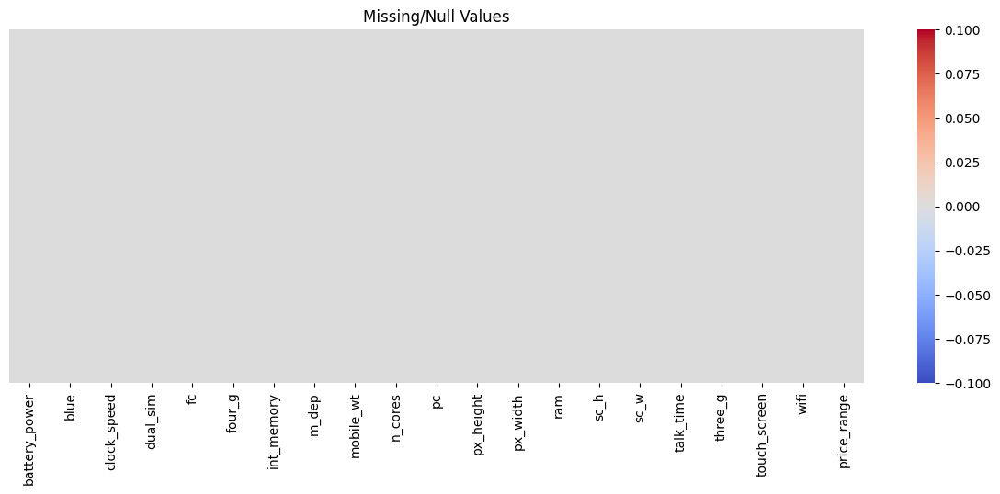

In [ ]:
# Visualizing the Missing/Null values
plt.figure(figsize=(15,5))
sns.heatmap(df.isnull(),cmap='coolwarm',annot=False,yticklabels=False)
plt.title("Missing/Null Values")

## ***2. Understanding Your Variables***

In [ ]:
# Dataset Columns
for i in df.columns:
  print(i)

battery_power
blue
clock_speed
dual_sim
fc
four_g
int_memory
m_dep
mobile_wt
n_cores
pc
px_height
px_width
ram
sc_h
sc_w
talk_time
three_g
touch_screen
wifi
price_range


###Understanding Your Variables

* Battery_power - Total energy a battery can store in one time measured in mAh
* Blue - Has bluetooth or not
* Clock_speed - speed at which microprocessor executes instructions
* Dual_sim - Has dual sim support or not
* Fc - Front Camera mega pixels
* Four_g - Has 4G or not
* Int_memory - Internal Memory in Gigabytes
* M_dep - Mobile Depth in cm
* Mobile_wt - Weight of mobile phone
* N_cores - Number of cores of processor
* Pc - Primary Camera mega pixels
* Px_height - Pixel Resolution Height
* Px_width - Pixel Resolution Width
* Ram - Random Access Memory in Mega
* Sc_h - Screen Height of mobile in cm
* Sc_w - Screen Width of mobile in cm
* Talk_time - longest time that a single battery charge will last when you are
* Three_g - Has 3G or not
* touch_screen - Has touch screen or not.
* Wifi - Has wifi or not
* Price_range - This is the target variable with value of 0(low cost), 1(medium cost), 2(high cost) and 3(very high cost).

### Check Unique Values for each variable.

In [ ]:
# Check Unique Values for each variable.
for i in df.columns:
  print(i)
  print(df[i].unique())
  print()

battery_power
[ 842 1021  563 ... 1139 1467  858]

blue
[0 1]

clock_speed
[2.2 0.5 2.5 1.2 1.7 0.6 2.9 2.8 2.1 1.  0.9 1.1 2.6 1.4 1.6 2.7 1.3 2.3
 2.  1.8 3.  1.5 1.9 2.4 0.8 0.7]

dual_sim
[0 1]

fc
[ 1  0  2 13  3  4  5  7 11 12 16  6 15  8  9 10 18 17 14 19]

four_g
[0 1]

int_memory
[ 7 53 41 10 44 22 24  9 33 17 52 46 13 23 49 19 39 47 38  8 57 51 21  5
 60 61  6 11 50 34 20 27 42 40 64 14 63 43 16 48 12 55 36 30 45 29 58 25
  3 54 15 37 31 32  4 18  2 56 26 35 59 28 62]

m_dep
[0.6 0.7 0.9 0.8 0.1 0.5 1.  0.3 0.4 0.2]

mobile_wt
[188 136 145 131 141 164 139 187 174  93 182 177 159 198 185 196 121 101
  81 156 199 114 111 132 143  96 200  88 150 107 100 157 160 119  87 152
 166 110 118 162 127 109 102 104 148 180 128 134 144 168 155 165  80 138
 142  90 197 172 116  85 163 178 171 103  83 140 194 146 192 106 135 153
  89  82 130 189 181  99 184 195 108 133 179 147 137 190 176  84  97 124
 183 113  92  95 151 117  94 173 105 115  91 112 123 129 154 191 175  86
  98 125 126 158 17

## 3. ***Data Wrangling***

### Data Wrangling Code

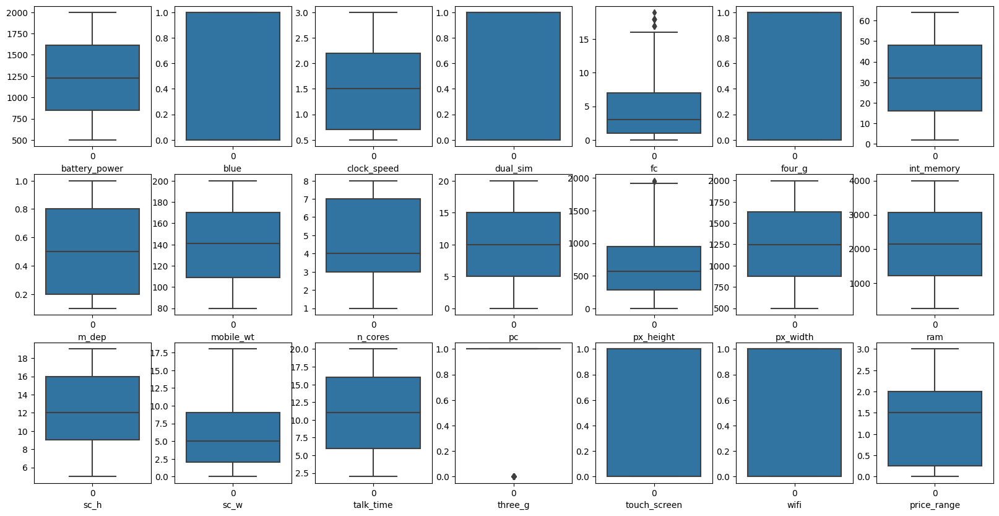

In [ ]:
# Handling Outliers & Outlier treatments
plt.figure(figsize=(20,10))
plt.title('Outlier Analysis of Numerical Features')

for i,col in enumerate(df.columns):
  plt.subplot(3, 7, i+1)
  sns.boxplot(df[col])
  plt.xlabel(col)

In [ ]:
columns = ['fc','px_height']
for col in df[columns]:
        q1 = df[col].quantile(0.25)
        q3 = df[col].quantile(0.75)
        iqr = q3 - q1
        lower_bound = q1 - 1.5 * iqr
        upper_bound = q3 + 1.5 * iqr
        df[col] = df[col].clip(lower_bound, upper_bound)

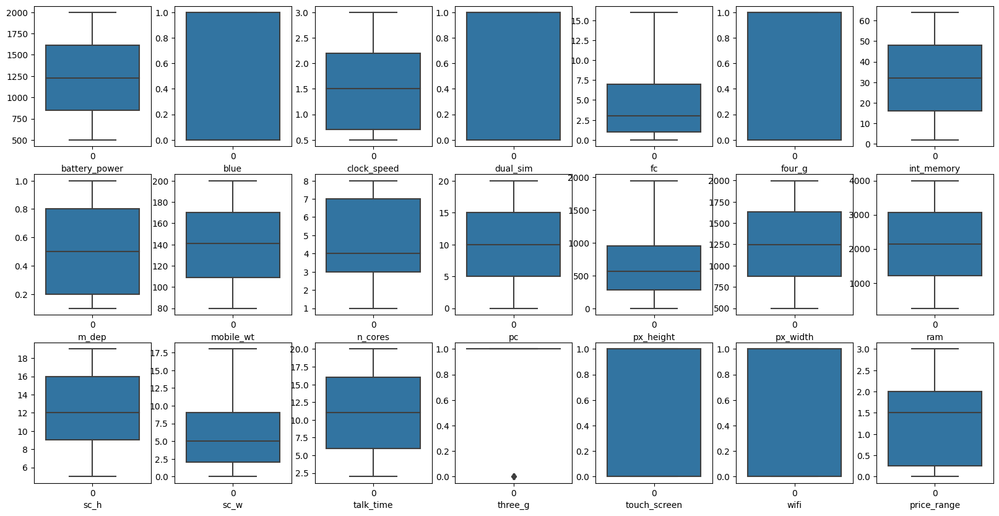

In [ ]:
#Checking outliers after treatment
plt.figure(figsize=(20,10))
plt.title('Outlier Analysis of Features')

for i,col in enumerate(df.columns):
  plt.subplot(3, 7, i+1)
  sns.boxplot(df[col])
  plt.xlabel(col)

### What all manipulations have you done and insights you found?

# **Nearest Neighbors Imputations (KNN Imputer)**

In [ ]:
# Replacing 0 with NAN so that we can implement KNN Imputer.
df['sc_w']=df['sc_w'].replace(0,np.nan)

In [ ]:
# importing KNN imputer from sklearn
from sklearn.impute import KNNImputer
impute_knn = KNNImputer(n_neighbors=1)
mobile_data=pd.DataFrame(impute_knn.fit_transform(df),columns=df.columns)

In [ ]:
# Checking shape
df.shape

(1998, 21)

## ***4. Data Vizualization, Storytelling & Experimenting with charts : Understand the relationships between variables***

#### Chart - 1

**Mobile Price Range Distribution**

In [ ]:
df['price_range'].value_counts()

2    500
0    500
1    499
3    499
Name: price_range, dtype: int64

Text(0.5, 1.0, 'Pie Chart for Price Ranges of Mobiles')

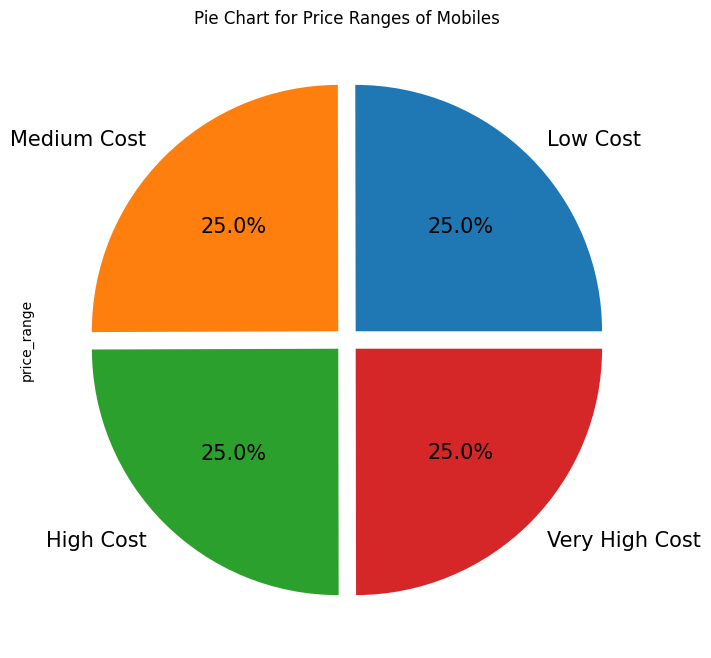

In [ ]:
# Visualizing the Target variable's class distribution.
labels = ["Low Cost", "Medium Cost", "High Cost", "Very High Cost"]
df['price_range'].value_counts().plot.pie(explode=[0.05]*4,labels=labels,autopct='%1.1f%%',figsize=(12,8),fontsize=15)
plt.title('Pie Chart for Price Ranges of Mobiles')

##### 1. Why did you pick the specific chart?

A pie chart helps organize and show data as a percentage of a whole.To check the percentage of prices of mobile phones i have used Pie chart.

##### 2. What is/are the insight(s) found from the chart?

There are 4 price ranges i.e **Low cost,Medium cost,High cost & Very high cost**,through the above pie chart it is very vell observed that the percentages for price ranges are almost similar.i.e **25%**

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

The insights wont help  to create any impact as all the price ranges are almost similar.

#### Chart - 2

In [ ]:
df['n_cores'].value_counts()

4    273
7    259
8    255
2    247
3    246
5    246
1    242
6    230
Name: n_cores, dtype: int64

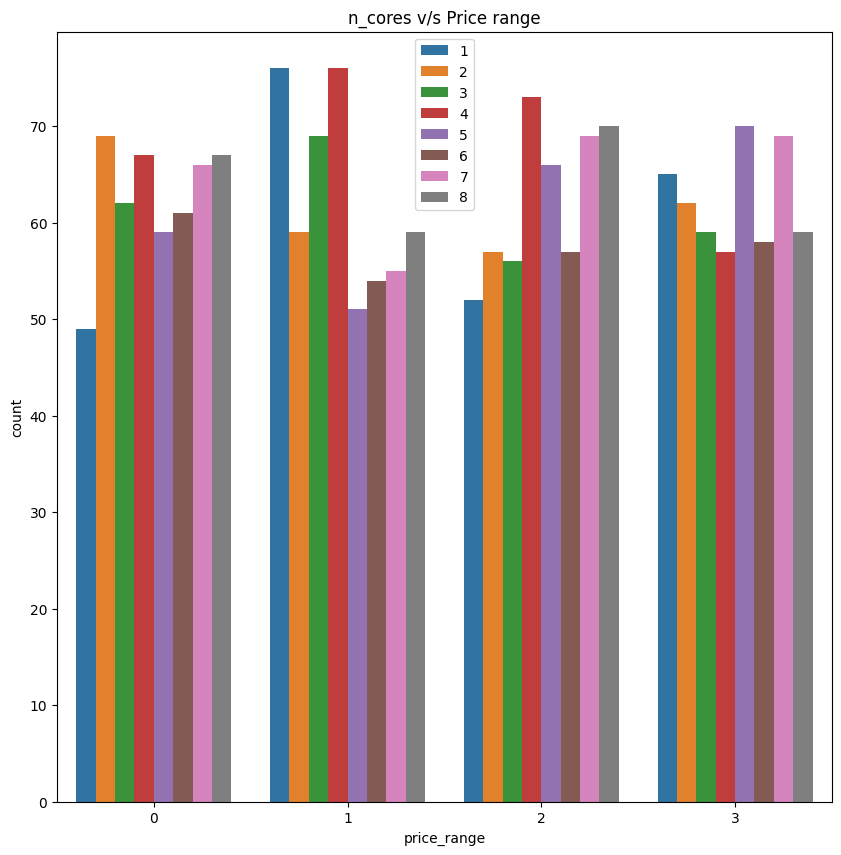

In [ ]:
# n_cores v/s price range
plt.figure(figsize=(10, 10))
sns.countplot(x='price_range', hue='n_cores', data=df)
plt.title("n_cores v/s Price range")
plt.legend(loc='best')
plt.show()

##### 1. Why did you pick the specific chart?

Countplots provide a concise and intuitive representation of the frequency distribution within categorical variables.To show the relationship of core processors with price range i have used countplot.

##### 2. What is/are the insight(s) found from the chart?

Price range 0 has majority of phones with 2 core processors

Price range 1 has majority of phones with 1 and 4 core processors

Price range 2 has majority of phones with 4 core processors

Price range 3 has majority of phones with 5 and 7 core processors

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

The presence of different core processors across different price ranges suggests a market that caters to diverse consumer preferences and needs. It offers consumers a range of choices and customization options, which can be considered a positive impact as it provides more flexibility and tailored solutions in the mobile device market.

#### Chart - 3

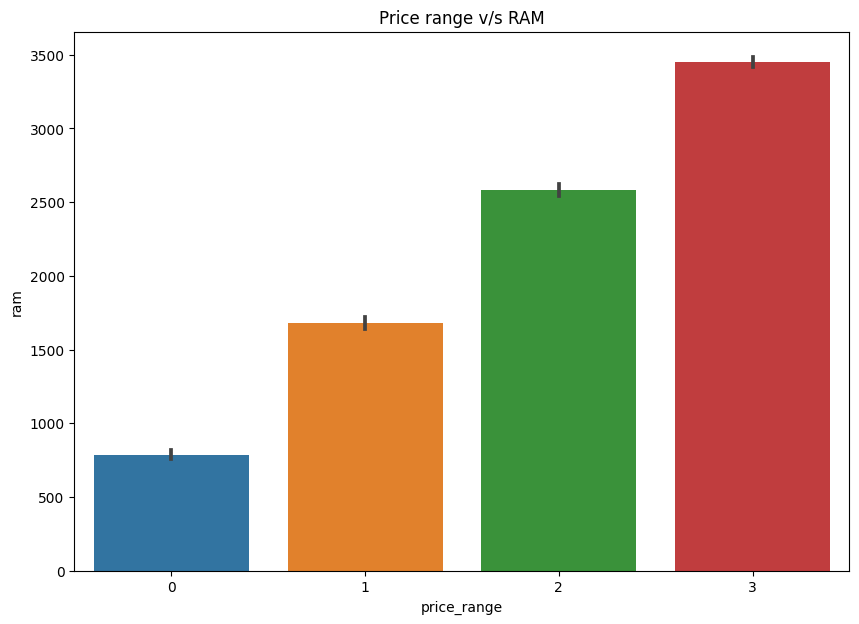

In [ ]:
# Chart - 3 visualization code
plt.figure(figsize=(10, 7))

# Plotting Price range v/s ram
plt.subplot(1, 1, 1)
sns.barplot(x='price_range', y='ram', data=df)
plt.title('Price range v/s RAM')
plt.show()

##### 1. Why did you pick the specific chart?

Bar charts show the frequency counts of values for the different levels of a categorical or nominal variable.To show the relation of ram with price range i have used bar graph.

##### 2. What is/are the insight(s) found from the chart?

It is observed from the graph that mobiles having RAM more than 3000 MB falls under Very High Cost category that depicts as RAM increases price range also increases.

It is also observed that mobiles having RAM under 1000 MB comes under the category of Low Cost.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

The observation of higher RAM capacities associated with higher price ranges and lower RAM capacities associated with lower price ranges can be seen as a positive impact. It provides transparency to consumers regarding the correlation between price and performance, allowing them to make informed decisions based on their budget and desired RAM capacity.

#### Chart - 4

**Chceking the Price**

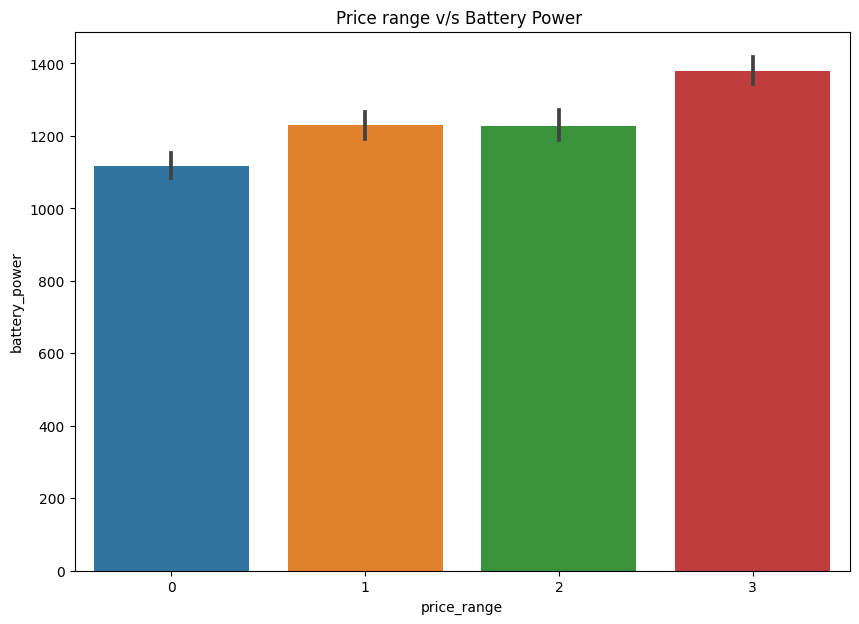

In [ ]:
# Chart - 4 visualization code
plt.figure(figsize=(10, 7))

# Plotting Price range v/s battery_power
plt.subplot(1, 1, 1)
sns.barplot(x='price_range', y='battery_power', data=df)
plt.title('Price range v/s Battery Power ')
plt.show()

##### 1. Why did you pick the specific chart?

Bar charts show the frequency counts of values for the different levels of a categorical or nominal variable.To show the relation of battery power with price range i have used bar graph.

##### 2. What is/are the insight(s) found from the chart?

Mobiles with battery power more than 1300 mAh has very high cost & Mobiles with battery power between 1200 and 1300 mAh falls under medium and high cost category whereas batter power below 1200 mAh falls under low cost category.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

The observation suggests a negative impact as it implies a potential trade-off between battery power and price. Consumers seeking devices with higher battery capacities might need to spend more, while those looking for lower-cost options might have to settle for devices with lower battery capacities. It highlights a potential limitation in the availability and accessibility of affordable devices with higher battery power.

#### Chart - 5

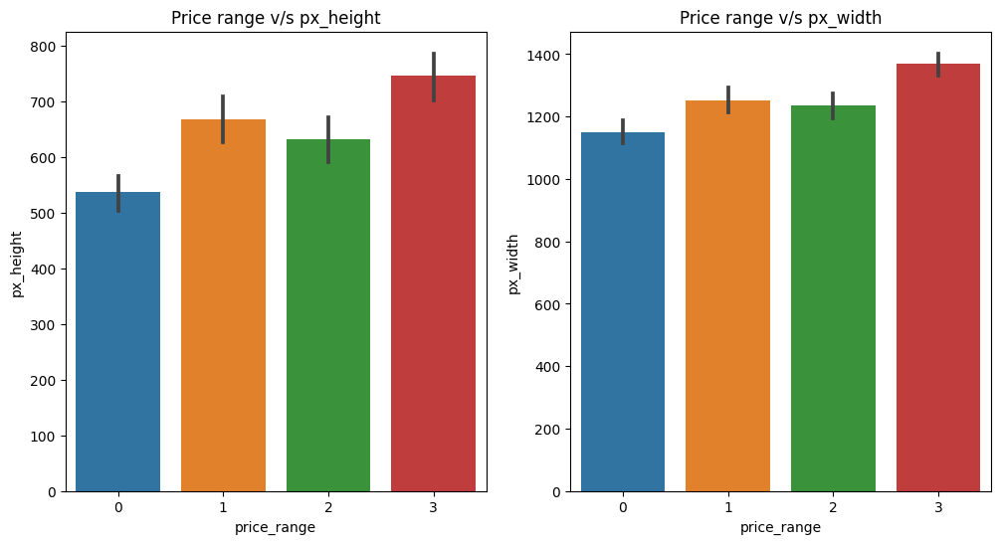

In [ ]:
# Chart - 5 visualization code
plt.figure(figsize=(12, 6))

# Plotting Price range v/s px_height
plt.subplot(1, 2, 1)
sns.barplot(x='price_range', y='px_height', data=df)
plt.title('Price range v/s px_height')

# Plotting Price range v/s px_width
plt.subplot(1, 2, 2)
sns.barplot(x='price_range', y='px_width', data=df)
plt.title('Price range v/s px_width')

plt.show()

##### 1. Why did you pick the specific chart?

Bar charts show the frequency counts of values for the different levels of a categorical or nominal variable.To show the relation of pixel height & pixel width with price range i have used bar graph.

##### 2. What is/are the insight(s) found from the chart?

Mobiles with more than 700 pixel height and width more than 1300 has very high cost.




##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

 It can be seen as positive impact as it indicates that higher-priced mobiles offer improved display quality, advanced technology, and an enhanced viewing experience

#### Chart - 6

**3G And 4G Connectivity**

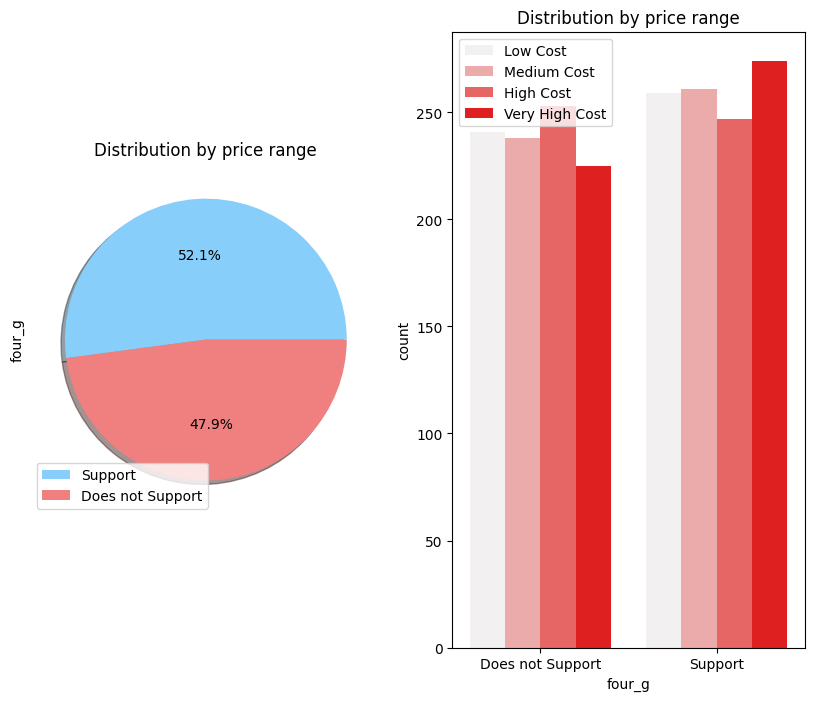

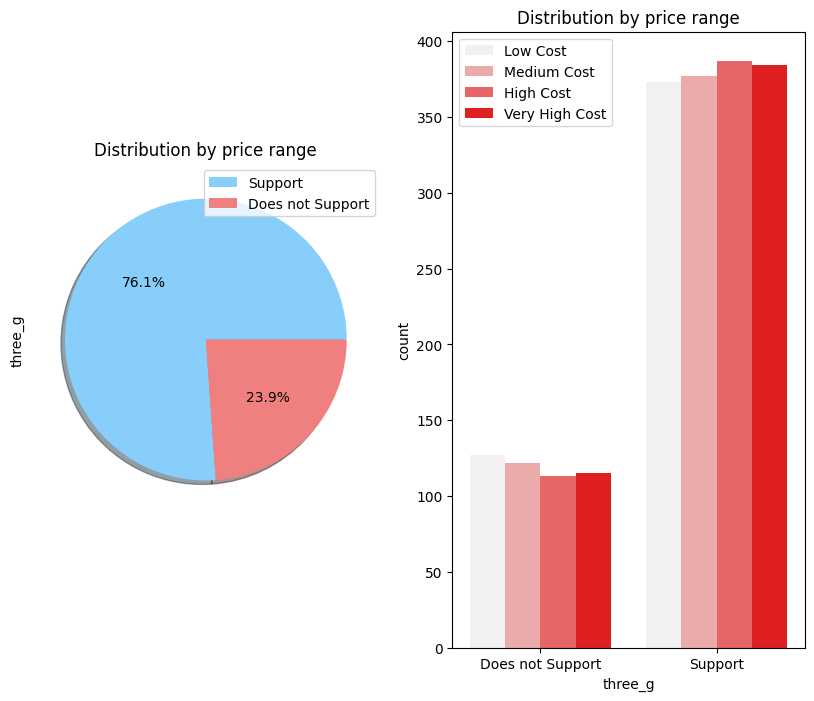

In [ ]:
# Chart - 6 visualization code
binary_features = ['four_g', 'three_g']

for data in binary_features:
    fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(10, 8))

    # Pie chart - Distribution by price range
    df[data].value_counts().plot.pie(autopct='%1.1f%%', ax=ax1, colors=['lightskyblue', 'lightcoral'], shadow=True, labeldistance=None)
    ax1.set_title('Distribution by price range')
    ax1.legend(['Support', 'Does not Support'])

    # Countplot - Distribution by price range
    sns.countplot(x=data, hue='price_range', data=df, ax=ax2, color='red')
    ax2.set_title('Distribution by price range')
    ax2.set_xlabel(data)
    ax2.legend(['Low Cost', 'Medium Cost', 'High Cost', 'Very High Cost'])
    ax2.set_xticklabels(['Does not Support', 'Support'])

plt.show()

##### 1. Why did you pick the specific chart?

A pie chart helps organize and show data as a percentage of a whole.To show the 3G & 4G connectivity on mobile phones i have used pie chart.Countplots provide a concise and intuitive representation of the frequency distribution within categorical variables.To show the counts of price ranges with respect to the 3G,4G conectivity i have used countplot.

##### 2. What is/are the insight(s) found from the chart?

* Distribution of price range almost similar of supported and non supported feature in 4G . So that is not useful of prediction.
* Feature 'three_g' play an important feature in Price prediction.As it depicts most of the mobiles have a 3G support and very less donot have 3G support.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Yes.it will help us to create a postitive business impact.

#### Chart - 7

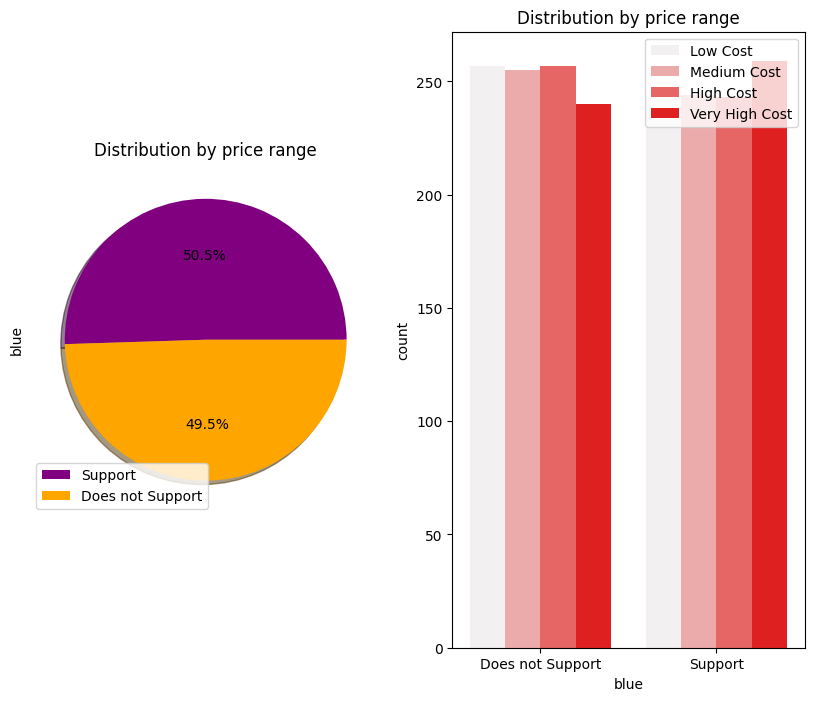

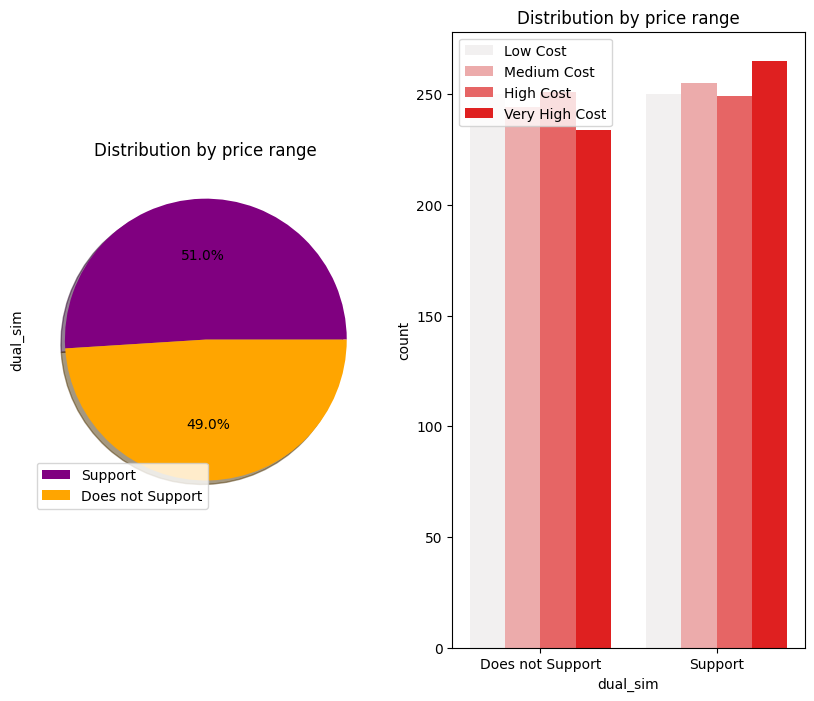

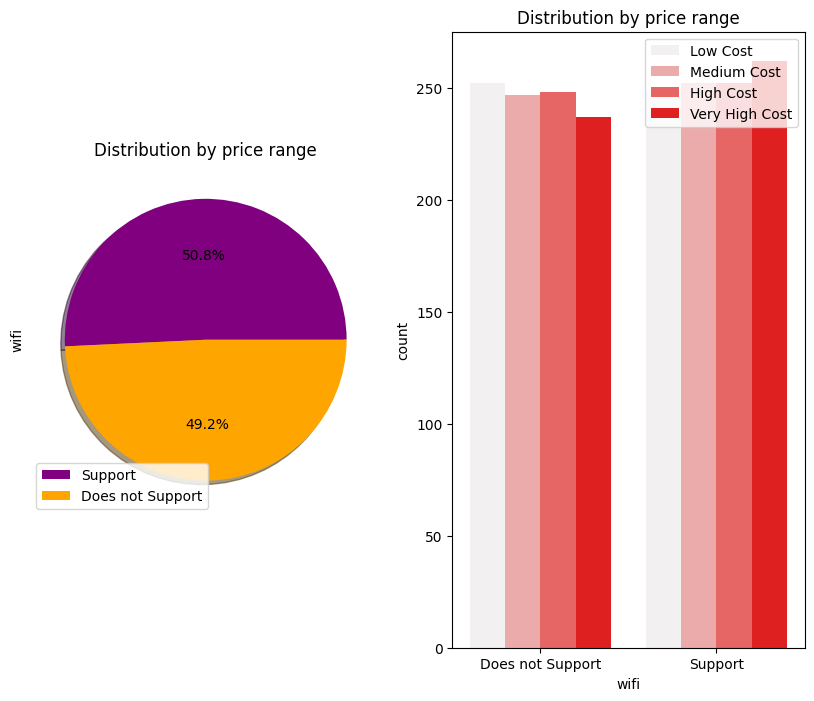

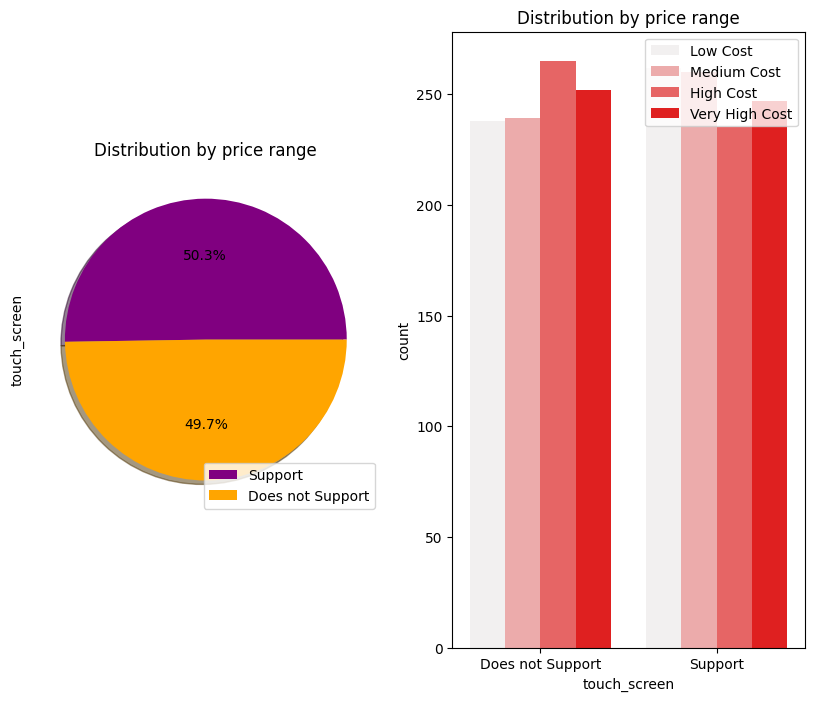

In [ ]:
# Chart - 7 visualization code
binary_features = ['blue','dual_sim','wifi','touch_screen']

for data in binary_features:
    fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(10, 8))

    # Pie chart - Distribution by price range
    df[data].value_counts().plot.pie(autopct='%1.1f%%', ax=ax1, colors=['purple', 'orange'], shadow=True, labeldistance=None)
    ax1.set_title('Distribution by price range')
    ax1.legend(['Support', 'Does not Support'])

    # Countplot - Distribution by price range
    sns.countplot(x=data, hue='price_range', data=df, ax=ax2, color='red')
    ax2.set_title('Distribution by price range')
    ax2.set_xlabel(data)
    ax2.legend(['Low Cost', 'Medium Cost', 'High Cost', 'Very High Cost'])
    ax2.set_xticklabels(['Does not Support', 'Support'])

##### 1. Why did you pick the specific chart?

A pie chart helps organize and show data as a percentage of a whole.To show the bluetooth,wifi,touch screen & dual sim availability in mobil phones i have used pie chart.Countplots provide a concise and intuitive representation of the frequency distribution within categorical variables.To show the counts of price ranges with respect to bluetooth,wifi,touch screen & dual sim i have used count plot.

##### 2. What is/are the insight(s) found from the chart?

Percentage Distribution of Mobiles having bluetooth,dual sim, 4G,wifi and touchscreen are almost 50 % also the countplot for all these features doesn't show much differences for supported & unsupported devices.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Yes.it will help us to create a postitive business impact.

#### Chart - 8:

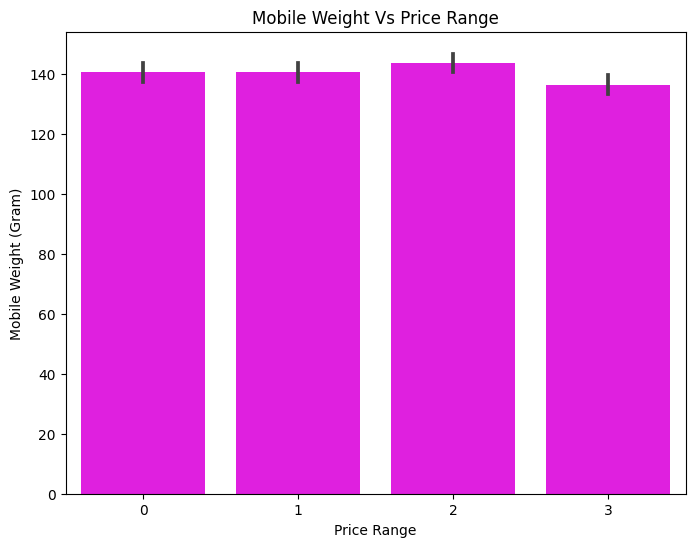

In [ ]:
# Chart - 8 visualization code
plt.figure(figsize=(8, 6))
sns.barplot(x='price_range', y='mobile_wt', data=df, color='magenta')
plt.xlabel("Price Range")
plt.ylabel("Mobile Weight (Gram)")
plt.title("Mobile Weight Vs Price Range")

plt.show()

##### 1. Why did you pick the specific chart?

Bar charts show the frequency counts of values for the different levels of a categorical or nominal variable.To show the relation of mobile weight with price range i have used bar graph.

##### 2. What is/are the insight(s) found from the chart?

It is observed that costly phones are lighter in weights.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

It will create a positive impact as it indicates that manufacturers are focusing on creating lightweight and portable devices, which align with user preferences for convenience, comfort, and enhanced user experiences.

#### Chart - 9 - Correlation Heatmap

<Axes: >

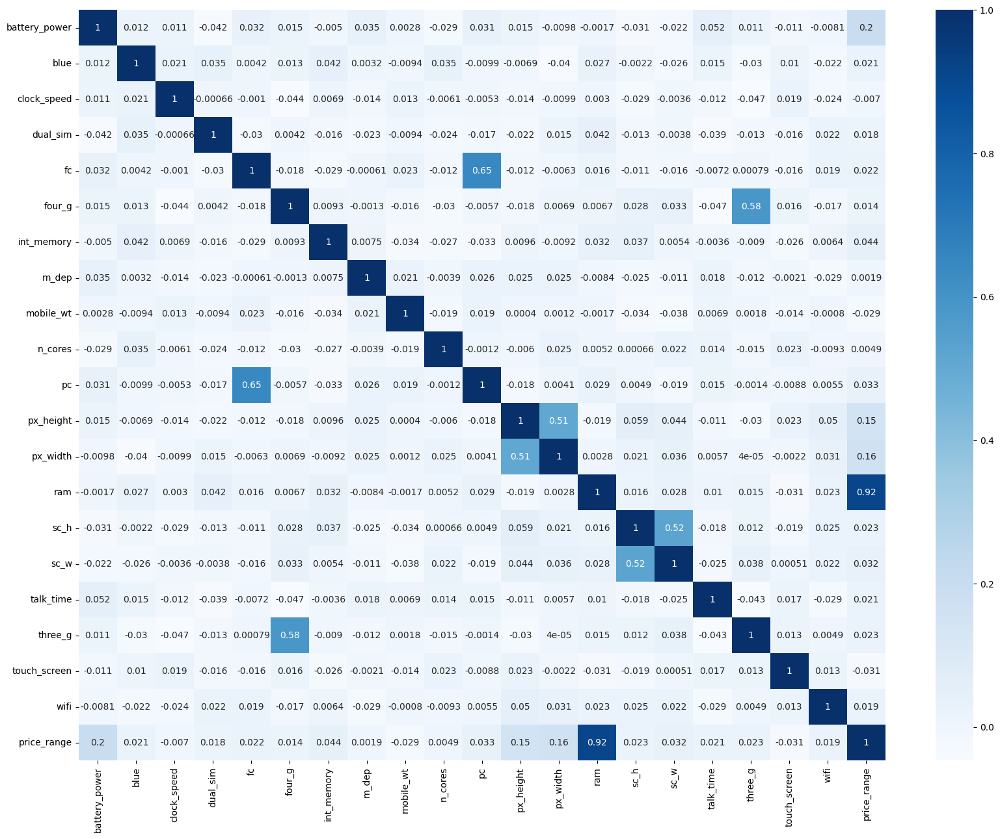

In [ ]:
# Correlation Heatmap visualization code
plt.figure(figsize = (20,15))
sns.heatmap(df.corr(), annot = True, cmap = 'Blues')

##### 1. Why did you pick the specific chart?

To plot rectangular correlation data as a color-encoded matrix. Heatmap is the best way to represent this kind of data and gives good insights at correlation level at single glance.

##### 2. What is/are the insight(s) found from the chart?

RAM has strong positive correlation with the Price_range. and we know that Mobiles with high RAM are very costly. Thus RAM increases price range also increase.

Battery_power also has positive correlation with the price range.Generally mobiles having high prices comes with good battery power.

Also px_height and px_width (Pixel Resolution Height and width) are positively correlated. Generally High price range mobiles have good resolutions.

Four_g and Three_g are highly positvely correlated. Nowdays most of the smart mobiles has both type of options. This could be the reason that they are correlated.

Primary camera i.e pc and front camera fc are positively correlated.

sc_h and sc_w are positively correlated.
Most of the variables have very little correlation to price range.

#### Chart - 10 - Pair Plot

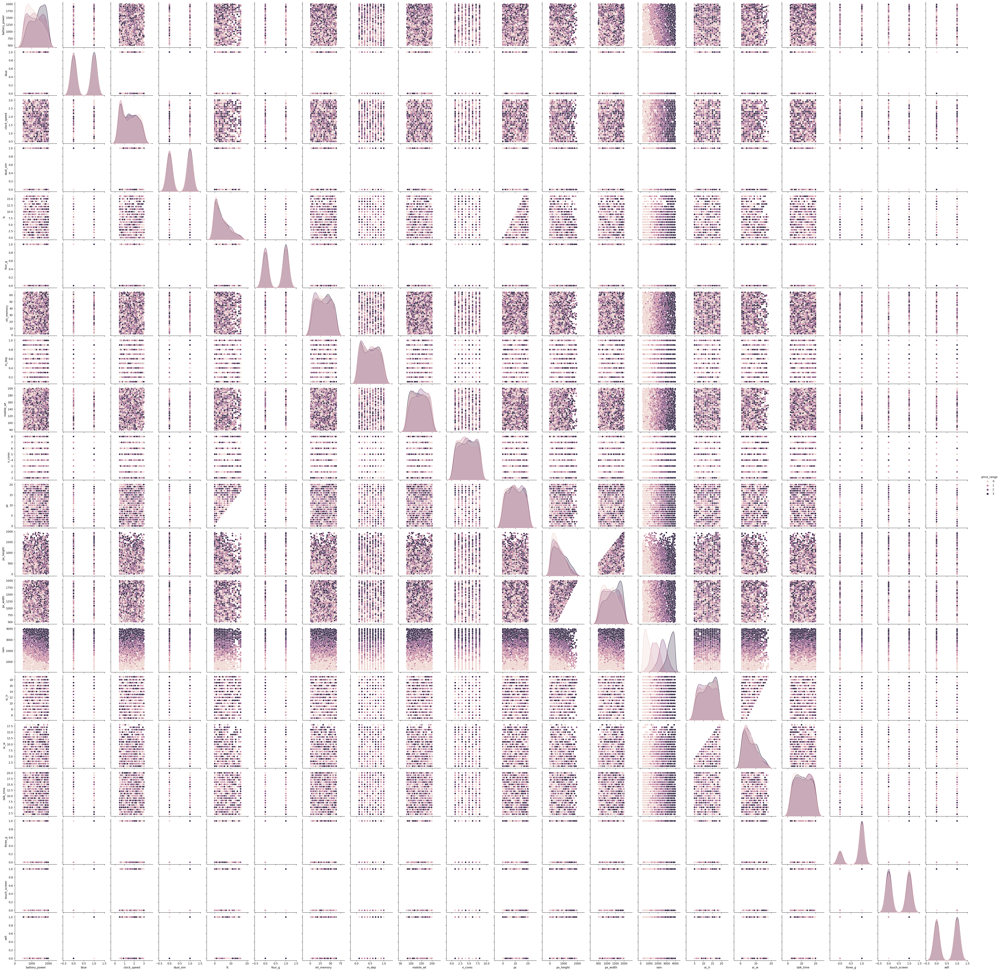

In [ ]:
# Pair Plot visualization code
sns.pairplot(df, hue="price_range")

##### 1. Why did you pick the specific chart?

To plot pairwise relationships in a dataset we use pairplot.

##### 2. What is/are the insight(s) found from the chart?

Very few columns have a correlation.

## ***5. Feature Engineering & Data Pre-processing***

### 1. Handling Missing Values

We have already handled all the Missing/Null Values in Data Wrangling Section.

### 2. Handling Outliers

Outliers are already removed in the Data Wrangling Section.

### 3. Categorical Encoding

There are no categorical values present in the Dataset. Hence, Encoding is not used.

### 4. Feature Manipulation & Selection

#### 1. Feature Manipulation

As per our observation, There is no need for Feature Manipulation in this dataset.

#### 2. Feature Selection

We have selected all the 21 Features present in the Dataset

### 3. Data Transformation

In [ ]:
# Transform Your data
# creating the set of dependent and independent variables
X = df.drop(labels='price_range', axis=1)
Y = df['price_range']

# print the shape of X and Y
print(f"The Number of Rows and Columns in X is {X.shape} respectively.")
print(f"The Number of Rows and Columns in Y is {Y.shape} respectively.")

The Number of Rows and Columns in X is (1998, 20) respectively.
The Number of Rows and Columns in Y is (1998,) respectively.


### 4. Data Scaling

In [ ]:
# Scaling data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

##### Which method have you used to scale you data and why?

I have used StandardScaler for Feature Scaling to normalize the range of independent variables or features of data.

### 5. Data Splitting

In [ ]:
# Split your data to train and test. Choose Splitting ratio wisely.
#importing train test split
X_train, X_test, Y_train, Y_test = train_test_split( X , Y , test_size = 0.2, random_state = 42)

##### What data splitting ratio have you used and why?

We have made the use of 80% and 20% Training and Testing data respectively.The data should be divided in such a way that neither of them is too high, which is more dependent on the ammount of data we have. If the data is too small, then no split will give satisfactory variance so we'll have to do cross-validation, but if the data is huge then it doesn’t really matter whether we choose an 80:20 split or a 90:10 split (indeed we may choose to use less training data as otherwise, it might be more computationally intensive).

### 6. Handling Imbalanced Dataset

As observed from the Chart-1 we have almost equal number of observation for each category. Thus we don't have an Imbalanced target variable.

## ***6. ML Model Implementation***

### ML Model - 1

#### **Logistic Regression Model**

In [ ]:
lr_model = LogisticRegression(random_state=1)
lr_model.fit(X_train,Y_train)

LogisticRegression(random_state=1)

In [ ]:
# Prediction
Y_pred_test = lr_model.predict(X_test)
Y_pred_train = lr_model.predict(X_train)

In [ ]:
# Evaluation metrics for test
print('Classification report for Logistic Regression (Test set)= ')
print(classification_report(Y_test,Y_pred_test))

Classification report for Logistic Regression (Test set)= 
              precision    recall  f1-score   support

           0       0.78      0.72      0.75        98
           1       0.48      0.52      0.50        91
           2       0.54      0.47      0.50       107
           3       0.69      0.79      0.74       104

    accuracy                           0.62       400
   macro avg       0.62      0.62      0.62       400
weighted avg       0.62      0.62      0.62       400



In [ ]:
#Generate the confusion matrix
cf_matrix = confusion_matrix(Y_test, Y_pred_test)
print(cf_matrix)

[[71 26  1  0]
 [20 47 22  2]
 [ 0 23 50 34]
 [ 0  2 20 82]]


In [ ]:
# Evaluation metrics for train
print('Classification report for Logistic Regression (Train set)= ')
print( classification_report(Y_pred_train, Y_train))

Classification report for Logistic Regression (Train set)= 
              precision    recall  f1-score   support

           0       0.80      0.83      0.81       389
           1       0.55      0.56      0.56       398
           2       0.45      0.48      0.46       366
           3       0.75      0.66      0.70       445

    accuracy                           0.64      1598
   macro avg       0.63      0.63      0.63      1598
weighted avg       0.64      0.64      0.64      1598



**Test Accuracy - 62%**

**Train Accuracy - 64%**

### ML Model - 2

#### **Decision Tree**

In [ ]:
# Applying Decision Tree
from sklearn.tree import DecisionTreeClassifier
dtc_model = DecisionTreeClassifier(max_depth = 5)
dtc_model.fit(X_train, Y_train)


DecisionTreeClassifier(max_depth=5)

In [ ]:
# Prediction
Y_pred_test = dtc_model.predict(X_test)
Y_pred_train = dtc_model.predict(X_train)

In [ ]:
accuracy_score(Y_test, Y_pred_test)

0.815

In [ ]:
# Evaluation metrics for test

print('Classification report for Decision Tree (Test set)= ')
print(classification_report(Y_test,Y_pred_test))

Classification report for Decision Tree (Test set)= 
              precision    recall  f1-score   support

           0       0.91      0.88      0.89        98
           1       0.71      0.81      0.76        91
           2       0.79      0.68      0.73       107
           3       0.85      0.89      0.87       104

    accuracy                           0.81       400
   macro avg       0.82      0.82      0.81       400
weighted avg       0.82      0.81      0.81       400



In [ ]:
# Evaluation metrics for train
print('Classification Report for Decision Tree (Train set)= ')
print(classification_report(Y_train, Y_pred_train))

Classification Report for Decision Tree (Train set)= 
              precision    recall  f1-score   support

           0       0.94      0.94      0.94       402
           1       0.84      0.88      0.86       408
           2       0.86      0.83      0.85       393
           3       0.94      0.92      0.93       395

    accuracy                           0.90      1598
   macro avg       0.90      0.90      0.90      1598
weighted avg       0.90      0.90      0.90      1598



In [ ]:
# Cross validation

grid = GridSearchCV(dtc_model, param_grid = {'max_depth': (5, 30), 'max_leaf_nodes': (10, 100)}, scoring = 'accuracy', cv = 5, verbose = 24)
grid.fit(X_train, Y_train)

Fitting 5 folds for each of 4 candidates, totalling 20 fits
[CV 1/5; 1/4] START max_depth=5, max_leaf_nodes=10..............................
[CV 1/5; 1/4] END max_depth=5, max_leaf_nodes=10;, score=0.778 total time=   0.0s
[CV 2/5; 1/4] START max_depth=5, max_leaf_nodes=10..............................
[CV 2/5; 1/4] END max_depth=5, max_leaf_nodes=10;, score=0.800 total time=   0.0s
[CV 3/5; 1/4] START max_depth=5, max_leaf_nodes=10..............................
[CV 3/5; 1/4] END max_depth=5, max_leaf_nodes=10;, score=0.816 total time=   0.0s
[CV 4/5; 1/4] START max_depth=5, max_leaf_nodes=10..............................
[CV 4/5; 1/4] END max_depth=5, max_leaf_nodes=10;, score=0.737 total time=   0.0s
[CV 5/5; 1/4] START max_depth=5, max_leaf_nodes=10..............................
[CV 5/5; 1/4] END max_depth=5, max_leaf_nodes=10;, score=0.806 total time=   0.0s
[CV 1/5; 2/4] START max_depth=5, max_leaf_nodes=100.............................
[CV 1/5; 2/4] END max_depth=5, max_leaf_node

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(max_depth=5),
             param_grid={'max_depth': (5, 30), 'max_leaf_nodes': (10, 100)},
             scoring='accuracy', verbose=24)

In [ ]:
# Prediction
Y_pred_test = grid.predict(X_test)
Y_pres_train = grid.predict(X_train)

# Evaluation metrics for test
print('Classification Report for Decision Tree (Test set)= ')
print(classification_report(Y_test, Y_pred_test))

Classification Report for Decision Tree (Test set)= 
              precision    recall  f1-score   support

           0       0.89      0.87      0.88        98
           1       0.75      0.82      0.79        91
           2       0.82      0.75      0.78       107
           3       0.86      0.89      0.88       104

    accuracy                           0.83       400
   macro avg       0.83      0.83      0.83       400
weighted avg       0.83      0.83      0.83       400



In [ ]:
#Generate the confusion matrix
cf_matrix = confusion_matrix(Y_test, Y_pred_test)
print(cf_matrix)

[[85 13  0  0]
 [10 75  6  0]
 [ 0 12 80 15]
 [ 0  0 11 93]]


In [ ]:
# Evaluation metrics for train
print('Classification Report for Decision Tree (Train set)= ')
print(classification_report(Y_train, Y_pred_train))

Classification Report for Decision Tree (Train set)= 
              precision    recall  f1-score   support

           0       0.94      0.94      0.94       402
           1       0.84      0.88      0.86       408
           2       0.86      0.83      0.85       393
           3       0.94      0.92      0.93       395

    accuracy                           0.90      1598
   macro avg       0.90      0.90      0.90      1598
weighted avg       0.90      0.90      0.90      1598



**Before Cross Validation**

* **Train Accuracy - 90%**

* **Test Accuracy - 81%**

**After Cross Validation**

* **Train Accuracy - 90%**

* **Test Accuracy - 83%**

### ML Model - 3

#### **XG Boost Model**

In [ ]:
# Applying XGBoost

from xgboost import XGBClassifier

xgb_model = XGBClassifier(max_depth = 5, learning_rate = 0.1)
xgb_model.fit(X_train, Y_train)
XGBClassifier(max_depth=5, objective='multi:softprob')

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=5, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              objective='multi:softprob', predictor=None, ...)

In [ ]:
# Prediction
Y_pred_train = xgb_model.predict(X_train)
Y_pred_test = xgb_model.predict(X_test)

In [ ]:
# Evaluation metrics for test
score = classification_report(Y_test, Y_pred_test)
print('Classification Report for XGBoost(Test set)= ')
print(score)

Classification Report for XGBoost(Test set)= 
              precision    recall  f1-score   support

           0       0.97      0.93      0.95        98
           1       0.86      0.92      0.89        91
           2       0.88      0.88      0.88       107
           3       0.94      0.91      0.93       104

    accuracy                           0.91       400
   macro avg       0.91      0.91      0.91       400
weighted avg       0.91      0.91      0.91       400



In [ ]:
# Evaluation metrics for train
score = classification_report(Y_train, Y_pred_train)
print('Classification Report for XGBoost(Train set)= ')
print(score)

Classification Report for XGBoost(Train set)= 
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       402
           1       1.00      1.00      1.00       408
           2       1.00      1.00      1.00       393
           3       1.00      1.00      1.00       395

    accuracy                           1.00      1598
   macro avg       1.00      1.00      1.00      1598
weighted avg       1.00      1.00      1.00      1598



In [ ]:
# Cross validation

grid = GridSearchCV(xgb_model, param_grid={'n_estimators': (10, 200), 'learning_rate': [1, 0.5, 0.1, 0.01, 0.001], 'max_depth': (5, 10),
                                     'gamma': [1.5, 1.8], 'subsample': [0.3, 0.5, 0.8]}, cv = 5, scoring = 'accuracy', verbose = 10)
grid.fit(X_train,Y_train)

Fitting 5 folds for each of 120 candidates, totalling 600 fits
[CV 1/5; 1/120] START gamma=1.5, learning_rate=1, max_depth=5, n_estimators=10, subsample=0.3
[CV 1/5; 1/120] END gamma=1.5, learning_rate=1, max_depth=5, n_estimators=10, subsample=0.3;, score=0.878 total time=   0.1s
[CV 2/5; 1/120] START gamma=1.5, learning_rate=1, max_depth=5, n_estimators=10, subsample=0.3
[CV 2/5; 1/120] END gamma=1.5, learning_rate=1, max_depth=5, n_estimators=10, subsample=0.3;, score=0.816 total time=   0.1s
[CV 3/5; 1/120] START gamma=1.5, learning_rate=1, max_depth=5, n_estimators=10, subsample=0.3
[CV 3/5; 1/120] END gamma=1.5, learning_rate=1, max_depth=5, n_estimators=10, subsample=0.3;, score=0.850 total time=   0.1s
[CV 4/5; 1/120] START gamma=1.5, learning_rate=1, max_depth=5, n_estimators=10, subsample=0.3
[CV 4/5; 1/120] END gamma=1.5, learning_rate=1, max_depth=5, n_estimators=10, subsample=0.3;, score=0.837 total time=   0.1s
[CV 5/5; 1/120] START gamma=1.5, learning_rate=1, max_depth=5

GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     gpu_id=None, grow_policy=None,
                                     importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=0.1, m...
                                     max_delta_step=None, max_depth=5,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=100, n_jobs=None,
                                     num_parallel_tree=None,
                                     objective='multi:softprob', predictor=None, ...),
             param_grid={'gamma': [1.5, 1.8],
                         'learning_rate': [1, 0.5, 0.1, 0.01, 0.001],
                         'max_depth': (5, 10), 'n_estimators': (10, 200),
                         'subsample': [0.3, 0.5, 0.8]},
             scoring='accuracy', verbose=10)

In [ ]:
# Prediction
Y_pred_train = grid.predict(X_train)
Y_pred_test = grid.predict(X_test)

# Evaluation metrics for test
score = classification_report(Y_test, Y_pred_test)
print('Classification Report for tuned XGBoost(Test set)= ')
print(score)

Classification Report for tuned XGBoost(Test set)= 
              precision    recall  f1-score   support

           0       0.99      0.92      0.95        98
           1       0.84      0.96      0.89        91
           2       0.88      0.84      0.86       107
           3       0.92      0.91      0.92       104

    accuracy                           0.91       400
   macro avg       0.91      0.91      0.91       400
weighted avg       0.91      0.91      0.91       400



In [ ]:
#Generate the confusion matrix
cf_matrix = confusion_matrix(Y_test, Y_pred_test)
print(cf_matrix)

[[90  8  0  0]
 [ 1 87  3  0]
 [ 0  9 90  8]
 [ 0  0  9 95]]


In [ ]:
# Evaluation metrics for train

score = classification_report(Y_train, Y_pred_train)
print('Classification Report for tuned XGBoost(Train set)= ')
print(score)

Classification Report for tuned XGBoost(Train set)= 
              precision    recall  f1-score   support

           0       0.99      1.00      0.99       402
           1       0.98      0.99      0.98       408
           2       0.98      0.98      0.98       393
           3       0.99      0.99      0.99       395

    accuracy                           0.99      1598
   macro avg       0.99      0.99      0.99      1598
weighted avg       0.99      0.99      0.99      1598



**Before Cross Validation**

* **Train Accuracy - 100%**

* **Test Accuracy - 91%**

**After Cross Validation**

* **Train Accuracy - 99%**

* **Test Accuracy - 91%**

### 1. Which Evaluation metrics did you consider for a positive business impact and why?

### 2. Which ML model did you choose from the above created models as your final prediction model and why?

# **Conclusion**

* From EDA we can see that, there are mobile phones in 4 price ranges.
The number of elements is almost similar.

* Half the devices have Bluetooth, and half don’t.

* There is a gradual increase in battery as the price range increases.

* Ram has continuous increase with price range while moving from Low cost to Very high cost.

* Costly phones are lighter.

* RAM, battery power, pixels played more significant role in deciding the price range of mobile phone.

I have implemented 3 classification models and achieved a fairly good result for all the algorithms.

* Logistic Regression
* Decision Tree
* XG Boost

* Logistic regression shows approx accuracy of 90% and the other two shows approx 80% accuracy, which shows that the data were properly classified.

* Logistic Regression performed better than the other two model.

### ***Hurrah! You have successfully completed your Machine Learning Capstone Project !!!***